# Task 8 (Extended). Practical analysis of advanced algorithms
## Task for the students well-experienced in algorithm analysis:

In [6]:
import random

import pandas as pd
import numpy as np
import datetime
from tqdm import tqdm

import plotly.express as px
import plotly.graph_objs as go

import matplotlib.pyplot as plt
import matplotlib as mpl

## I. Choose an algorithm (interesting to you and not considered in the course) from the above-mentioned book sections.

In [ ]:
"""
I Foundations
|- 4 Divide-and-Conquer 65
   |- 4.2 Strassen’s algorithm for matrix multiplication 75
"""

In [3]:
def generate_sqare_matrix(size):
    # 1st argument --> numbers ranging from 0 to size, 
    # 2nd argument, row = , col = 
    return np.random.randint(size, size=(size, size))

In [4]:
def get_average_time_from_5_matrix_product(A, B):
    average_time = 0
    time_5_calcs = []
    
    for i in range(5):
        time_start = datetime.datetime.now()

        product_holder = strassen_algorithm(A, B)

        time_stop = datetime.datetime.now()
        time_5_calcs.append((time_stop - time_start).total_seconds())
    
        average_time = sum(time_5_calcs) / 5

    return average_time

In [5]:
def solution_of_matrix_product(matrix_size):
    vector_time = []
    for current_size in tqdm(range(1, matrix_size)):
        matrix_A = generate_sqare_matrix(current_size)
        matrix_B = generate_sqare_matrix(current_size)
        
        current_average_time = get_average_time_from_5_matrix_product(matrix_A, matrix_B)

        print(f'Итерация:{current_size}, время выполнения {round(current_average_time, 3)}')

        vector_time.append(current_average_time)

    return vector_time

In [6]:
def strassen_algorithm(x, y):
    """
    Computes matrix product by divide and conquer approach, recursively.
    Input:  n x n matrices x and y
    Output: n x n matrix, product of x and y
    """
    if x.size == 1 or y.size == 1:
        return x * y

    n = x.shape[0]

    if n % 2 == 1:
        x = np.pad(x, (0, 1), mode='constant')
        y = np.pad(y, (0, 1), mode='constant')

    m = int(np.ceil(n / 2))
    a = x[: m, : m]
    b = x[: m, m:]
    c = x[m:, : m]
    d = x[m:, m:]
    e = y[: m, : m]
    f = y[: m, m:]
    g = y[m:, : m]
    h = y[m:, m:]
    p1 = strassen_algorithm(a, f - h)
    p2 = strassen_algorithm(a + b, h)
    p3 = strassen_algorithm(c + d, e)
    p4 = strassen_algorithm(d, g - e)
    p5 = strassen_algorithm(a + d, e + h)
    p6 = strassen_algorithm(b - d, g + h)
    p7 = strassen_algorithm(a - c, e + f)
    result = np.zeros((2 * m, 2 * m), dtype=np.int32)
    result[: m, : m] = p5 + p4 - p2 + p6
    result[: m, m:] = p1 + p2
    result[m:, : m] = p3 + p4
    result[m:, m:] = p1 + p5 - p3 - p7

    return result[: n, : n]

In [11]:
vector_time = solution_of_matrix_product(100)

Итерация:1, время выполнения 0.0
Итерация:2, время выполнения 0.0
Итерация:3, время выполнения 0.001
Итерация:4, время выполнения 0.0
Итерация:5, время выполнения 0.002
Итерация:6, время выполнения 0.002
Итерация:7, время выполнения 0.002
Итерация:8, время выполнения 0.002
Итерация:9, время выполнения 0.017
Итерация:10, время выполнения 0.018
Итерация:11, время выполнения 0.017
Итерация:12, время выполнения 0.016
Итерация:13, время выполнения 0.013
Итерация:14, время выполнения 0.013
Итерация:15, время выполнения 0.012
Итерация:16, время выполнения 0.012
Итерация:17, время выполнения 0.118
Итерация:18, время выполнения 0.118
Итерация:19, время выполнения 0.117
Итерация:20, время выполнения 0.116
Итерация:21, время выполнения 0.113
Итерация:22, время выполнения 0.112
Итерация:23, время выполнения 0.113
Итерация:24, время выполнения 0.113
Итерация:25, время выполнения 0.087
Итерация:26, время выполнения 0.087
Итерация:27, время выполнения 0.085
Итерация:28, время выполнения 0.084
Итераци

100%|██████████| 99/99 [38:47<00:00, 23.51s/it]


In [5]:
a = np.random.randint(0, 10, size=(100, 100))
b = np.random.randint(0, 10, size=(100, 100))

strassen_algorithm(a, b)

In [26]:
# TimeComplexityNaive() - is a helper func that used for 
# printing plot to show Time Complexity of Naive algorithm
def TimeComplexityNaive(x):
    return x ** 3

In [27]:
# TheoreticalTimeComplexityStrassen() - is a helper func that used for 
# printing plot to show Theoretical Time Complexity of Strassen’s algorithm
def TheoreticalTimeComplexityStrassen(x):
    return x ** 2.8074

In [140]:
# print_plot - draws a legend for calculation algorithm
def print_plot(dataframe, algorithm):
    fig = go.Figure()
    fig = px.line(dataframe, title=algorithm) # ВОТ ЭТОМУ как нибудь
    
    fig.update_layout(
        title="Experiment",
        legend_title="Runtime",
    )
    
    x = np.arange(0, 100, 0.001)
    fig.add_trace(go.Scatter(x=x, y=TimeComplexityNaive(x), name='$$f(x)=O(n^3)$$'))
    fig.add_trace(go.Scatter(x=x, y=TheoreticalTimeComplexityStrassen(x), name='$$f(x)=O(n^{2.8074})$$'))
    fig.update_layout(yaxis_range=[0,100])

    fig.show()

In [139]:
time_df = pd.DataFrame(vector_time)
# Rename df column, for beauty legend title
time_df = time_df.rename(columns={
    0 : "$$O(Strassen\;Algorithm)$$"
})

In [128]:
time_df

,$$O(Strassen Algorithm)$$
0,0.000004
1,0.000038
2,0.000581
3,0.000246
4,0.002394
...,...
94,5.464283
95,5.662777
96,11.726847
97,11.842714


The time complexity using the Master Theorem.

$T(n) = 7T(n/2) + O(n^2) = O(n^log(7))$ runtime.

Approximately $O(n^2.8074)$ which is better than $O(n^3)$

In [141]:
print_plot(time_df, "Experiment")

In [163]:
fig = go.Figure()
fig = px.line(time_df)

fig.update_xaxes(title="Size of Matrix")
fig.update_yaxes(title="Time 4 Multiplication")

fig.update_layout(
    title="Experiment",
    legend_title="Runtime",
    legend_orientation="h",
    legend=dict(x=.5, xanchor="center"),
    hovermode="x",
    margin=dict(l=0.5, r=0.5, t=35, b=35))

fig.show()

In [104]:
fig = go.Figure()
fig = px.line(time_df[60:80], title="Experiment")

x = np.arange(60, 80, 0.001)
fig.add_trace(go.Scatter(x=x, y=TimeComplexityNaive(x), name='$$f(x)=O(n^3)$$'))
fig.add_trace(go.Scatter(x=x, y=TheoreticalTimeComplexityStrassen(x), name='$$f(x)=O(n^{2.8074})$$'))
fig.show()

## II. Choose an algorithm interesting to you and proposed at most 10 years ago in a research paper for solving a certain practical problem (including optimization algorithms, graph algorithms, etc.).

## Self-Organizing Maps to solve the Traveling Salesman Problem

In [18]:
def read_tsp(filename):
    """
    Read a file in .tsp format into a pandas DataFrame
    The .tsp files can be found in the TSPLIB project. Currently, the library
    only considers the possibility of a 2D map.
    """
    with open(filename) as f:
        node_coord_start = None
        dimension = None
        lines = f.readlines()

        # Obtain the information about the .tsp
        i = 0
        while not dimension or not node_coord_start:
            line = lines[i]
            if line.startswith('DIMENSION :'):
                dimension = int(line.split()[-1])
            if line.startswith('NODE_COORD_SECTION'):
                node_coord_start = i
            i = i+1

        print('Problem with {} cities read.'.format(dimension))

        f.seek(0)

        # Read a data frame out of the file descriptor
        cities = pd.read_csv(
            f,
            skiprows=node_coord_start + 1,
            sep=' ',
            names=['city', 'y', 'x'],
            dtype={'city': str, 'x': np.float64, 'y': np.float64},
            header=None,
            nrows=dimension
        )

        # cities.set_index('city', inplace=True)

        return cities

def normalize(points):
    """
    Return the normalized version of a given vector of points.
    For a given array of n-dimensions, normalize each dimension by removing the
    initial offset and normalizing the points in a proportional interval: [0,1]
    on y, maintining the original ratio on x.
    """
    ratio = (points.x.max() - points.x.min()) / (points.y.max() - points.y.min()), 1
    ratio = np.array(ratio) / max(ratio)
    norm = points.apply(lambda c: (c - c.min()) / (c.max() - c.min()))
    return norm.apply(lambda p: ratio * p, axis=1)

In [20]:
def select_closest(candidates, origin):
    """Return the index of the closest candidate to a given point."""
    return euclidean_distance(candidates, origin).argmin()

def euclidean_distance(a, b):
    """Return the array of distances of two numpy arrays of points."""
    return np.linalg.norm(a - b, axis=1)

def route_distance(cities):
    """Return the cost of traversing a route of cities in a certain order."""
    points = cities[['x', 'y']]
    distances = euclidean_distance(points, np.roll(points, 1, axis=0))
    return np.sum(distances)

In [21]:
def generate_network(size):
    """
    Generate a neuron network of a given size.
    Return a vector of two dimensional points in the interval [0,1].
    """
    return np.random.rand(size, 2)

def get_neighborhood(center, radix, domain):
    """Get the range gaussian of given radix around a center index."""

    # Impose an upper bound on the radix to prevent NaN and blocks
    if radix < 1:
        radix = 1

    # Compute the circular network distance to the center
    deltas = np.absolute(center - np.arange(domain))
    distances = np.minimum(deltas, domain - deltas)

    # Compute Gaussian distribution around the given center
    return np.exp(-(distances*distances) / (2*(radix*radix)))

def get_route(cities, network):
    """Return the route computed by a network."""
    cities['winner'] = cities[['x', 'y']].apply(
        lambda c: select_closest(network, c),
        axis=1, raw=True)

    return cities.sort_values('winner').index

In [166]:
def plot_network(cities, neurons, name='/data/notebook_files/diagram.png', ax=None):
    """Plot a graphical representation of the problem"""
    mpl.rcParams['agg.path.chunksize'] = 10000

    if not ax:
        fig = plt.figure(figsize=(5, 5), frameon = False)
        axis = fig.add_axes([0,0,1,1])

        axis.set_aspect('equal', adjustable='datalim')
        plt.axis('off')

        axis.scatter(cities['x'], cities['y'], color='red', s=4)
        axis.plot(neurons[:,0], neurons[:,1], 'r.', ls='-', color='#0063ba', markersize=2)

        plt.savefig(name, bbox_inches='tight', pad_inches=0, dpi=200)
        plt.close()

    else:
        ax.scatter(cities['x'], cities['y'], color='red', s=4)
        ax.plot(neurons[:,0], neurons[:,1], 'r.', ls='-', color='#0063ba', markersize=2)
        return ax

def plot_route(cities, route, name='/data/notebook_files/diagram.png', ax=None):
    """Plot a graphical representation of the route obtained"""
    mpl.rcParams['agg.path.chunksize'] = 10000

    if not ax:
        fig = plt.figure(figsize=(5, 5), frameon = False)
        axis = fig.add_axes([0,0,1,1])

        axis.set_aspect('equal', adjustable='datalim')
        plt.axis('off')

        axis.scatter(cities['x'], cities['y'], color='red', s=4)
        route = cities.reindex(route)
        route.loc[route.shape[0]] = route.iloc[0]
        axis.plot(route['x'], route['y'], color='purple', linewidth=1)

        plt.savefig(name, bbox_inches='tight', pad_inches=0, dpi=200)
        plt.close()

    else:
        ax.scatter(cities['x'], cities['y'], color='red', s=4)
        route = cities.reindex(route)
        route.loc[route.shape[0]] = route.iloc[0]
        ax.plot(route['x'], route['y'], color='purple', linewidth=1)
        return ax

In [162]:
def som(problem, iterations, learning_rate=0.8):
    """Solve the TSP using a Self-Organizing Map."""

    # Obtain the normalized set of cities (w/ coord in [0,1])
    cities = problem.copy()

    cities[['x', 'y']] = normalize(cities[['x', 'y']])

    # The population size is 8 times the number of cities
    n = cities.shape[0] * 8

    # Generate an adequate network of neurons:
    network = generate_network(n)
    print('Network of {} neurons created. Starting the iterations:'.format(n))

    for i in range(iterations):
        if not i % 100:
            print('\t> Iteration {}/{}'.format(i, iterations), end="\r")
        # Choose a random city
        city = cities.sample(1)[['x', 'y']].values
        winner_idx = select_closest(network, city)
        # Generate a filter that applies changes to the winner's gaussian
        gaussian = get_neighborhood(winner_idx, n//10, network.shape[0])
        # Update the network's weights (closer to the city)
        network += gaussian[:,np.newaxis] * learning_rate * (city - network)
        # Decay the variables
        learning_rate = learning_rate * 0.99997
        n = n * 0.9997

        # Check for plotting interval
        if not i % 1000:
            plot_network(cities, network, name='/data/notebook_files/diagrams/{:05d}.png'.format(i))

        # Check if any parameter has completely decayed.
        if n < 1:
            print('Radius has completely decayed, finishing execution',
            'at {} iterations'.format(i))
            break
        if learning_rate < 0.001:
            print('Learning rate has completely decayed, finishing execution',
            'at {} iterations'.format(i))
            break
    else:
        print('Completed {} iterations.'.format(iterations))

    plot_network(cities, network, name='/data/notebook_files/diagrams/final.png')

    route = get_route(cities, network)
    plot_route(cities, route, '/data/notebook_files/diagrams/route.png')
    return route

In [167]:
def solution(path, iterations):
    problem = read_tsp(path)

    route = som(problem, iterations)

    problem = problem.reindex(route)

    distance = route_distance(problem)

    print('Route found of length {}'.format(distance))

In [168]:
EGYPT_PATH = "/data/notebook_files/eg7146.tsp"

### Egypt 7146 iterations

Problem with 7146 cities read.
Network of 57168 neurons created. Starting the iterations:
Completed 7146 iterations.


<ipython-input-166-9927c5a0ac4f>:13: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.



FileNotFoundError: FileNotFoundError: [Errno 2] No such file or directory: '/data/notebook_files/diagrams/final.png'

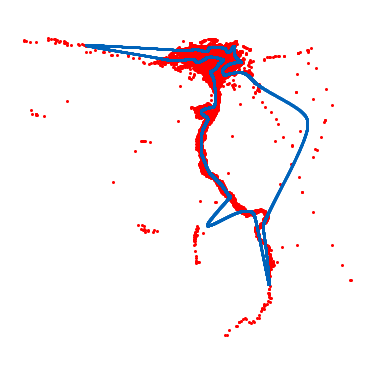

In [169]:
solution(EGYPT_PATH, 7146) 

Problem with 7146 cities read.
Network of 57168 neurons created. Starting the iterations:
Completed 10000 iterations.


<ipython-input-5-6a9fba751e7a>:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.
  axis.plot(neurons[:,0], neurons[:,1], 'r.', ls='-', color='#0063ba', markersize=2)


FileNotFoundError: FileNotFoundError: [Errno 2] No such file or directory: 'diagrams/final.png'

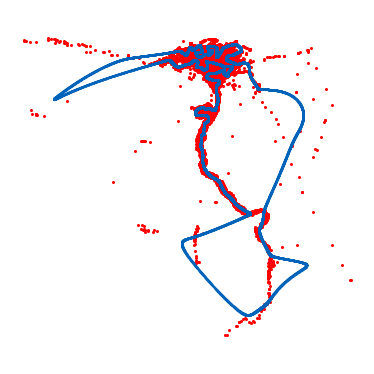

In [13]:
solution(EGYPT_PATH, 10000) 

Problem with 7146 cities read.
Network of 57168 neurons created. Starting the iterations:
Radius has completely decayed, finishing execution at 36507 iterations


<ipython-input-5-6a9fba751e7a>:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.
  axis.plot(neurons[:,0], neurons[:,1], 'r.', ls='-', color='#0063ba', markersize=2)


FileNotFoundError: FileNotFoundError: [Errno 2] No such file or directory: 'diagrams/final.png'

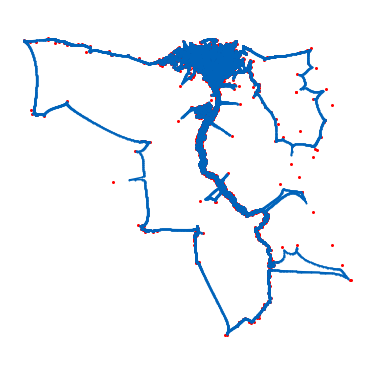

In [16]:
Solution(EGYPT_PATH, 100000) 

In [170]:
JAPAN_PATH = "/data/notebook_files/ja9847.tsp"

Problem with 9847 cities read.
Network of 78776 neurons created. Starting the iterations:
Completed 9847 iterations.


<ipython-input-166-9927c5a0ac4f>:13: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.



FileNotFoundError: FileNotFoundError: [Errno 2] No such file or directory: '/data/notebook_files/diagrams/final.png'

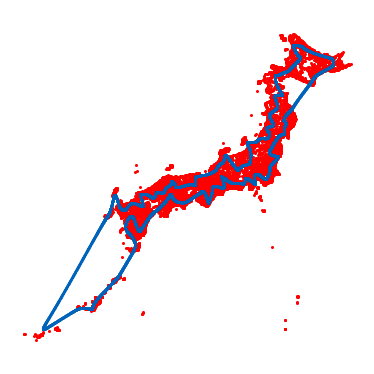

In [171]:
solution(JAPAN_PATH, 9847)

Problem with 9847 cities read.
Network of 78776 neurons created. Starting the iterations:
Completed 10000 iterations.


<ipython-input-166-9927c5a0ac4f>:13: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.



FileNotFoundError: FileNotFoundError: [Errno 2] No such file or directory: '/data/notebook_files/diagrams/final.png'

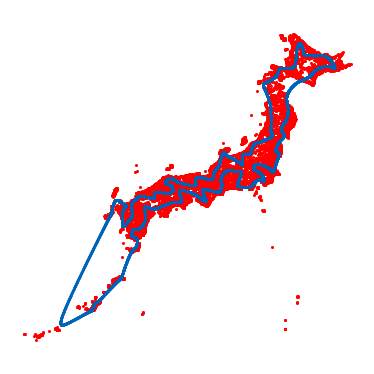

In [172]:
solution(JAPAN_PATH, 10000)

Problem with 9847 cities read.
Network of 78776 neurons created. Starting the iterations:
Radius has completely decayed, finishing execution at 37575 iterations


<ipython-input-166-9927c5a0ac4f>:13: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.



FileNotFoundError: FileNotFoundError: [Errno 2] No such file or directory: '/data/notebook_files/diagrams/final.png'

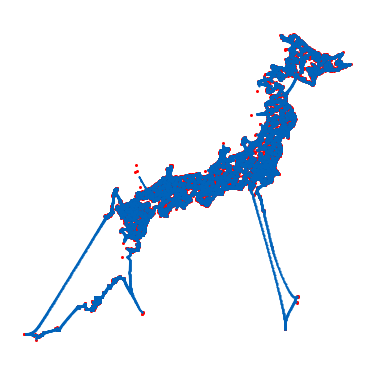

In [173]:
solution(JAPAN_PATH, 100000)

## II. Analyse the chosen algorithms in terms of time and space complexity, design technique used, etc. Implement the algorithms and produce several experiments. Analyse the results.

In [ ]:
"""
I Foundations
|- 33 Divide-and-Conquer 65
   |- 33.1 Clustering 1296
"""

In [125]:
# k-Means Algorithm (Lloyd's Algorithm) 
def cluster_points(X, mu):
    clusters  = {}
    for x in X:
        bestmukey = min([(i[0], np.linalg.norm(x-mu[i[0]])) \
                    for i in enumerate(mu)], key=lambda t:t[1])[0]
        try:
            clusters[bestmukey].append(x)
        except KeyError:
            clusters[bestmukey] = [x]
    return clusters

def reevaluate_centers(mu, clusters):
    newmu = []
    keys = sorted(clusters.keys())
    for k in keys:
        newmu.append(np.mean(clusters[k], axis = 0))
    return newmu

def has_converged(mu, oldmu):
    return set([tuple(a) for a in mu]) == set([tuple(a) for a in oldmu])

def find_centers(X, K):

    # Initialize to K random centers
    oldmu = random.sample(list(X), K) # < list(X) cause TypeError: Population must be a sequence or set. For dicts, use list(d).
    mu = random.sample(list(X), K)
    while not has_converged(mu, oldmu):
        oldmu = mu
        # Assign all points in X to clusters
        clusters = cluster_points(X, mu)
        # Reevaluate centers
        mu = reevaluate_centers(oldmu, clusters)
    return mu, clusters

In [126]:
# Initialization
def init_board(N):
    X = np.array([(random.uniform(-1, 1), random.uniform(-1, 1)) for i in range(N)])
    return X    

def init_board_gauss(N, k):
    n = float(N)/k
    X = []
    for i in range(k):
        c = (random.uniform(-1, 1), random.uniform(-1, 1))
        s = random.uniform(0.05,0.5)
        x = []
        while len(x) < n:
            a, b = np.array([np.random.normal(c[0], s), np.random.normal(c[1], s)])
            # Continue drawing points from the distribution in the range [-1,1]
            if abs(a) < 1 and abs(b) < 1:
                x.append([a,b])
        X.extend(x)
    X = np.array(X)[:N]
    return X

In [131]:
def get_classification(n_points, n_clusters):
    # Initialize points
    # n_points = 200
    # n_clusters = 7
    X = init_board_gauss(n_points, n_clusters)

    # Cluster points
    time_start = datetime.datetime.now()
    print(f"Time Before Start={datetime.datetime.now()}")

    mu, clusters = find_centers(X, n_clusters)
    clusters = cluster_points(X, mu)
    time_stop = datetime.datetime.now()
    print(f"Finished={time_stop}\n{(time_stop - time_start).total_seconds()} seconds")

    # Plot each cluster
    for i in range(0, n_clusters):
        colx = tuple(x[0] for x in clusters[i])
        coly = tuple(x[1] for x in clusters[i])
        cluster_color = generate_random_color()
        plt.scatter(colx,coly, color=cluster_color)
    
    return clusters

    # Generate random colors
def generate_random_color():
    r = lambda: random.randint(0,255)
    return '#%02X%02X%02X' % (r(),r(),r())

Time Before Start=2022-10-21 11:14:21.489190
Finished=2022-10-21 11:14:21.583395
0.094208 seconds


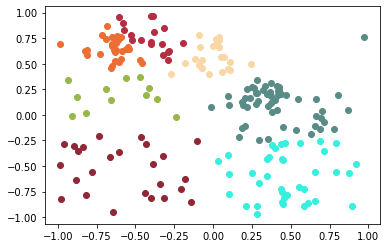

In [132]:
clusters_7 = get_classification(200, 7)

Time Before Start=2022-10-21 11:14:32.583862
Finished=2022-10-21 11:14:38.579972
5.996115 seconds


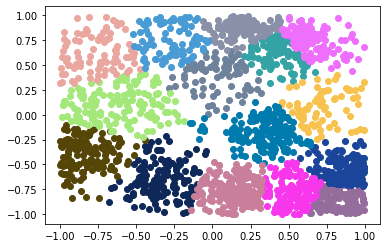

In [133]:
clusters_15 = get_classification(2000, 15)

In [100]:
# cols = [f"class_{i}" for i in range(n_clusters)]
df = pd.DataFrame.from_dict(clusters, orient='index')
df = df.transpose()

In [152]:
for i in range(7:
    print(pd.DataFrame(clusters_7))

ValueError: ValueError: All arrays must be of the same length

In [146]:
def printClassPlot(clusters, n_clusters):
    fig = go.Figure()
    
    for i in range(0, n_clusters):
        # colx = tuple(x[0] for x in clusters[i])
        # coly = tuple(x[1] for x in clusters[i])
        # cluster_color = generate_random_color()
        for point in clusters[i]:
            fig.add_pointcloud(x=point[0], y=point[1])


    fig.show()

In [147]:
printClassPlot(clusters_7, 7)

ValueError: ValueError: 
    Invalid value of type 'numpy.float64' received for the 'x' property of pointcloud
        Received value: -0.7171700620035656

    The 'x' property is an array that may be specified as a tuple,
    list, numpy array, or pandas Series

## III. Analyse the chosen algorithms in terms of time and space complexity, design technique used, etc. Implement the algorithms (or use the existing ones from the research paper) and produce several experiments. Your experiments should differ of those in the research paper. Analyse the results.